In [1]:
import re
import numpy as np
import pandas as pd

pd.set_option('max_colwidth',50)
pd.set_option('max_columns',250)
pd.set_option('max_rows',500)

#visualizations
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns 
import plotly.plotly as py
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly import tools as tls
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
from mpl_toolkits.basemap import Basemap
%matplotlib inline 
sns.set_style("whitegrid") #possible choices: white, dark, whitegrid, darkgrid, ticks

### Define function for dataset statistics

In [2]:
def get_stats(df, sort_by='Different Values', sort_how=False, exclude=[], include_only=[], target='target'):
        columns = [c for c in df.columns.values if c not in exclude and c in include_only]
        df=df[columns]
        # Total missing values
        mis_val = df.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        
        # Data types
        data_types = df.dtypes
        
        # Different Values
        other_values = pd.DataFrame(columns=['Different Values','Most Common','% of Most Common','Skewness',
                                            'Kurtosis','Mean','Min','25% quantile','Median','75% quantile','Max'])
        for c in columns:
            if (df[c].dtype != 'object'):
                other_values = other_values.append({
                    'Name' : c,
                    'Different Values' : df[c].value_counts().count(),
                    'Most Common' : df[c].value_counts().idxmax(),
                    '% of Most Common' : 100*df[c].value_counts().max() / df[c].value_counts().sum(),
                    'Skewness' : df[c].skew(),
                    'Kurtosis' : df[c].kurt(),
                    'Mean' : df[c].mean(),
                    'Min' : df[c].min(),
                    '25% quantile' : df[c].quantile(0.25),
                    'Median' : df[c].median(),
                    '75% quantile' : df[c].quantile(0.75),
                    'Max' : df[c].max(),
                                                    }, ignore_index=True)
            else:
                other_values = other_values.append({
                    'Name' : c,
                    'Different Values' : df[c].value_counts().count(),
                    'Most Common' : df[c].value_counts().idxmax(),
                    '% of Most Common' : 100*df[c].value_counts().max() / df[c].value_counts().sum()
                                                    }, ignore_index=True)                
        other_values = other_values.set_index('Name')
        
        
        # Make a table with the results
        mis_val_table = pd.concat([data_types, other_values, mis_val, mis_val_percent], axis=1, sort=False)       
        
        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0:'Type',
                   'Different Values':'Different Values',
                   'Most Common':'Most Common',
                   '% of Most Common':'% of Most Common',
                   'Skewness':'Skewness', 
                   'Kurtosis':'Kurtosis', 
                   1:'Missing Values', 
                   2:'% of Missing Values',
                   'Mean' : 'Mean',
                   'Min' : 'Min',
                   '25% quantile' : '25% quantile',
                   'Median' : 'Median',
                   '75% quantile' : '75% quantile',
                   'Max' : 'Max',
        })
        
        # Sort the table 
        mis_val_table_ren_columns = mis_val_table_ren_columns.sort_values(sort_by, ascending=sort_how)
        df = mis_val_table_ren_columns
        
        # Re-arrange columns
        #cols = df.columns.tolist()
        #cols = cols[0:1] + cols[7:8]# + cols[0:1] + cols[2:3] + cols[3:4] + cols[5:6] + cols[4:5] + cols[6:7] +cols[7:8] +cols[8:9] + cols[9:10]
        #df = df[cols]
        
        # Print some summary information
        print ("Your selected dataframe has " + str(df.shape[0]) + " columns. (" +
        str(df[df['Type']=='object'].shape[0])+" categorical and "+str(df[df['Type']!='object'].shape[0])+" numerical).\n"
        "There are " + str(df[df['Missing Values']>0].shape[0]) +" columns that have missing values, of which " +
        str(df[df['% of Missing Values']>=90].shape[0]) + " have over 90%!\n" +
        str(df[(df['Type']=='object')&(df['Different Values']<5)].shape[0]) + 
        " object type columns have less than 5 different values and you can consider one-hot encoding, while " + 
        str(df[(df['Type']=='object')&(df['Different Values']>=5)].shape[0]) +
        " have more than 5 colums and you can consider label encoding.\n" +
        str(df[df['Skewness']>1].shape[0]) + " columns are highly positively skewed (skewness>1), while " +
        str(df[df['Skewness']<-1].shape[0]) + " columns are highly negatively skewed (skewness<-1).\n" +
        str(df[(df['Skewness']>-0.5)&(df['Kurtosis']<0.5)].shape[0]) + " columns are symmetrical (-0.5<skewness<0.5).\n" +
        str(df[df['Kurtosis']>3].shape[0]) + " columns have high kurtosis (kurtosis>3) and should be check for outliers, while " + 
        str(df[df['Kurtosis']<3].shape[0]) + " columns have low kurtosis (kurtosis<3). "
        )        
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns

### True Data
|    | Scientific name          | Common_name_GRE | Common_name_ENG        | Habitat       | Depth range (m) | Usual depth range (m) |
|----|--------------------------|-----------------|------------------------|---------------|-----------------|-----------------------|
| 1  | Engraulis encrasicolus   | Γαυρος          | European anchovy       | Pelagic       | 0-400           | 0-200                 |
| 2  | Sardina pilchardus       | Σαρδέλα         | European sardine       | Pelagic       | 10-100          | 25-100                |
| 3  | Sardinella aurita        | Φρίσσα          | Round sardinella       | Pelagic       | 0-350           | 0-200                 |
| 4  | Scomber scombrus         | Σκουμπρί        | Atlantic mackerel      | Pelagic       | 0-1000          | 0-200                 |
| 5  | Scomber colias           | Κολιός          | Atlantic chub mackerel | Pelagic       | 0-300           | 50-200                |
| 6  | Boops boops              | Γώπα            | Bogue                  | Demersal      | 0-350           | 0-100                 |
| 7  | Spicara smaris           | Μαρίδα          | picarel                | Pelagic       | 15-330          | 10-200                |
| 8  | Mullus barbatus          | Κουτσομούρα     | Red mullet             | Demersal      | 10-330          | 100-300               |
| 9  | Mullus surmuletus        | Μπαρμπούνι      | Surmullet              | Demersal      | 5-400           | 0-100                 |
| 10 | Merluccius merluccius    | Μπακαλιάρος     | Hake                   | Demersal      | 30-1000         | 70-400                |
| 11 | Micromesistius poutassou | Προσφυγάκι      | Blue whiting           | Bathypelagic  | 150-3000        | 300-400               |
| 12 | Thunnus thynnus          | Ερυθρός τόννος  | Bluefin tuna           | Pelagic       | 0-1000          | 0-100                 |
| 13 | Xiphias gladius          | Ξιφίας          | Swordfish              | Pelagic       | 0-3000          | 0-550                 |
| 14 | Pagellus erythrinus      | Λυθρίνι         | Common pandora         | Benthopelagic | 20-300          | 20-100                |
| 15 | Solea solea              | Γλώσσα          | Common sole            | Demersal      | 0-150           | 10-60                 |
| 16 | Lophius budegassa        | Πεσκαντρίτσες   | Anglerfish             | Bathydemersal | 70-1000         | 100-500               |

In [3]:
# Load Data
engraulis_encrasicolus = pd.read_csv('the16species_final/Engraulis encrasicolus.csv')
sardina_pilchardus = pd.read_csv('the16species_final/Sardina pilchardus.csv')
sardinella_aurita = pd.read_csv('the16species_final/Sardinella aurita.csv')
scomber_scombrus = pd.read_csv('the16species_final/Scomber scombrus.csv')
scomber_colias = pd.read_csv('the16species_final/Scomber colias.csv')
boops_boops = pd.read_csv('the16species_final/Boops boops.csv')
spicara_smaris = pd.read_csv('the16species_final/Spicara smaris.csv')
mullus_barbatus = pd.read_csv('the16species_final/Mullus barbatus barbatus.csv')
mullus_surmuletus = pd.read_csv('the16species_final/Mullus surmuletus.csv')
merluccius_merluccius = pd.read_csv('the16species_final/Merluccius merluccius.csv')
micromesistius_poutassou = pd.read_csv('the16species_final/Micromesistius poutassou.csv')
thunnus_thynnus = pd.read_csv('the16species_final/Thunnus thynnus.csv')
xiphias_gladius = pd.read_csv('the16species_final/Xiphias gladius.csv')
pagellus_erythrinus = pd.read_csv('the16species_final/Pagellus erythrinus.csv')
solea_solea = pd.read_csv('the16species_final/Solea solea.csv')
lophius_budegassa = pd.read_csv('the16species_final/Lophius budegassa.csv')

## Engraulis encrasicolus
<img src="Engraulis encrasicolus.jpg" alt="Engraulis encrasicolus" width="200px" align="left"/>
Engraulis encrasicolus is a pelagic species and lives in depths between 0-400m.

In [4]:
print("There are {} observations and {} variables.".format(engraulis_encrasicolus.shape[0],engraulis_encrasicolus.shape[1]))

There are 729 observations and 566 variables.


I choose to analyze the "Year" columns and only the "Surface" columns, as according to previous research seem to be much more important that MaxDepth values for the Machine Learning models.

In [5]:
columns = [c for c in engraulis_encrasicolus.columns.values if (c.endswith('Year') and '00' not in c and 'Max' not in c) or 'iver' in c or 'ubstrate' in c]
columns.append('Bathymetry')
columns

['TemperatureSurface_Year',
 'SalinitySurface_Year',
 'DissolvedOxygenSurface_Year',
 'MeridionalCurrentSurface_Year',
 'ZonalCurrentSurface_Year',
 'Chlorophyll_Year',
 'EuphoticDepth_Year',
 'Secchi_Year',
 'WaveHeight_Year',
 'majorRiversStart_Distance',
 'majorRiversStart_Scale',
 'majorRiversEnd_Distance',
 'majorRiversEnd_Scale',
 'substrateType',
 'substrateOrigHabitat',
 'substrateBiozone',
 'Bathymetry']

In [6]:
get_stats(engraulis_encrasicolus, sort_by='Mean', sort_how=False, include_only=columns)

Your selected dataframe has 17 columns. (3 categorical and 14 numerical).
There are 0 columns that have missing values, of which 0 have over 90%!
1 object type columns have less than 5 different values and you can consider one-hot encoding, while 2 have more than 5 colums and you can consider label encoding.
6 columns are highly positively skewed (skewness>1), while 4 columns are highly negatively skewed (skewness<-1).
5 columns are symmetrical (-0.5<skewness<0.5).
8 columns have high kurtosis (kurtosis>3) and should be check for outliers, while 6 columns have low kurtosis (kurtosis<3). 


,Type,Different Values,Most Common,% of Most Common,Skewness,Kurtosis,Mean,Min,25% quantile,Median,75% quantile,Max,Missing Values,% of Missing Values
Name,,,,,,,,,,,,,,
majorRiversStart_Distance,float64,729,370.356,0.137174,1.016067,0.135087,377.219969,20.069816,182.724465,290.961667,522.450782,1140.799940,0,0.0
majorRiversEnd_Distance,float64,729,733.331,0.137174,1.197558,0.479957,329.423385,1.695953,130.095702,228.664513,451.083253,1145.778520,0,0.0
DissolvedOxygenSurface_Year,float64,715,220.103,0.548697,-1.920216,15.290154,213.996962,105.852755,208.579969,215.293376,220.057481,288.530608,0,0.0
SalinitySurface_Year,float64,715,37.4351,0.548697,-1.911721,9.998390,38.182465,30.586933,37.809117,38.179350,38.860000,39.643642,0,0.0
Secchi_Year,float64,729,23.0788,0.137174,-0.290430,-0.280647,18.953734,1.574965,14.499767,20.054867,23.439242,36.027275,0,0.0
TemperatureSurface_Year,float64,715,15.3549,0.548697,0.054854,-0.312995,17.873020,12.907340,16.731750,17.648125,19.023483,21.603925,0,0.0
majorRiversStart_Scale,int64,7,9,47.462277,-1.434486,2.561390,8.016461,2.000000,7.000000,8.000000,9.000000,9.000000,0,0.0
majorRiversEnd_Scale,int64,6,9,33.058985,-1.731441,4.656358,7.528121,1.000000,7.000000,8.000000,9.000000,9.000000,0,0.0
Bathymetry,float64,155,0,69.410151,7.130841,62.149773,7.152341,0.000000,0.000000,0.000000,6.949683,253.318694,0,0.0


### Temperature

In [7]:
hist_data = [engraulis_encrasicolus['TemperatureSurface_Year']]
group_labels = ['Temperature']
fig = ff.create_distplot(hist_data, group_labels)
distplot1=fig['data']

hist_data = [engraulis_encrasicolus['SalinitySurface_Year']]
group_labels = ['Salinity']
fig = ff.create_distplot(hist_data, group_labels)
distplot2=fig['data']

hist_data = [engraulis_encrasicolus['DissolvedOxygenSurface_Year']]
group_labels = ['Dissolved Oxygen']
fig = ff.create_distplot(hist_data, group_labels)
distplot3=fig['data']

hist_data = [engraulis_encrasicolus['ZonalCurrentSurface_Year']]
group_labels = ['Zonal Current']
fig = ff.create_distplot(hist_data, group_labels, bin_size=.01)
distplot4=fig['data']

hist_data = [engraulis_encrasicolus['MeridionalCurrentSurface_Year']]
group_labels = ['Meridional Current']
fig = ff.create_distplot(hist_data, group_labels, bin_size=.01)
distplot5=fig['data']

hist_data = [engraulis_encrasicolus['EuphoticDepth_Year']]
group_labels = ['Euphotic Depth']
fig = ff.create_distplot(hist_data, group_labels, bin_size=.1)
distplot6=fig['data']

hist_data = [engraulis_encrasicolus['Chlorophyll_Year']]
group_labels = ['Chlorophyll']
fig = ff.create_distplot(hist_data, group_labels, bin_size=.1)
distplot7=fig['data']

hist_data = [engraulis_encrasicolus['Secchi_Year']]
group_labels = ['Secchi Disk Depth']
fig = ff.create_distplot(hist_data, group_labels)
distplot8=fig['data']

hist_data = [engraulis_encrasicolus['Bathymetry']]
group_labels = ['Bathymetry']
fig = ff.create_distplot(hist_data, group_labels)
distplot9=fig['data']

hist_data = [engraulis_encrasicolus['majorRiversStart_Distance']]
group_labels = ['Rivers Distance from Start']
fig = ff.create_distplot(hist_data, group_labels)
distplot10=fig['data']

hist_data = [engraulis_encrasicolus['majorRiversEnd_Distance']]
group_labels = ['Rivers Distance from End']
fig = ff.create_distplot(hist_data, group_labels)
distplot11=fig['data']

hist_data = [engraulis_encrasicolus['WaveHeight_Year']]
group_labels = ['Wave Height']
fig = ff.create_distplot(hist_data, group_labels, bin_size=.1)
distplot12=fig['data']

my_fig = tls.make_subplots(rows=4, cols=3, subplot_titles=('Temperature', 'Salinity', 'Dissolved Oxygen', 'Zonal Current',
            'Meridional Current','Euphotic Depth','Chlorophyll','Secchi Disk Depth','Bathymetry', 
            'Rivers Distance from Start', 'Rivers Distance from End','Wave Height'))
my_fig.layout.update(title='Engraulis Encrasicolus Distribution' ,barmode = 'overlay', bargap=0.05, height=880, width=960)

my_fig.append_trace(distplot1[0], 1, 1);my_fig.append_trace(distplot1[1], 1, 1)
my_fig.append_trace(distplot2[0], 1, 2);my_fig.append_trace(distplot2[1], 1, 2)
my_fig.append_trace(distplot3[0], 1, 3);my_fig.append_trace(distplot3[1], 1, 3)
my_fig.append_trace(distplot4[0], 2, 1);my_fig.append_trace(distplot4[1], 2, 1)
my_fig.append_trace(distplot5[0], 2, 2);my_fig.append_trace(distplot5[1], 2, 2)
my_fig.append_trace(distplot6[0], 2, 3);my_fig.append_trace(distplot6[1], 2, 3)
my_fig.append_trace(distplot7[0], 3, 1);my_fig.append_trace(distplot7[1], 3, 1)
my_fig.append_trace(distplot8[0], 3, 2);my_fig.append_trace(distplot8[1], 3, 2)
my_fig.append_trace(distplot9[0], 3, 3);my_fig.append_trace(distplot9[1], 3, 3)
my_fig.append_trace(distplot10[0], 4, 1);my_fig.append_trace(distplot10[1], 4, 1)
my_fig.append_trace(distplot11[0], 4, 2);my_fig.append_trace(distplot11[1], 4, 2)
my_fig.append_trace(distplot12[0], 4, 3);my_fig.append_trace(distplot12[1], 4, 3)
iplot(my_fig)

This is the format of your plot grid:
[ (1,1) x1,y1 ]    [ (1,2) x2,y2 ]    [ (1,3) x3,y3 ]  
[ (2,1) x4,y4 ]    [ (2,2) x5,y5 ]    [ (2,3) x6,y6 ]  
[ (3,1) x7,y7 ]    [ (3,2) x8,y8 ]    [ (3,3) x9,y9 ]  
[ (4,1) x10,y10 ]  [ (4,2) x11,y11 ]  [ (4,3) x12,y12 ]



Engraulis encrasicolus is a species that prefers temperatures around 17.6 and also around 20.5 degrees. Temperature has a binomial distribution, but with small skewness and kurtosis values it resembles the normal distribution with very few outliers. Same observations can be made for secchi disk depth.

### Correlations

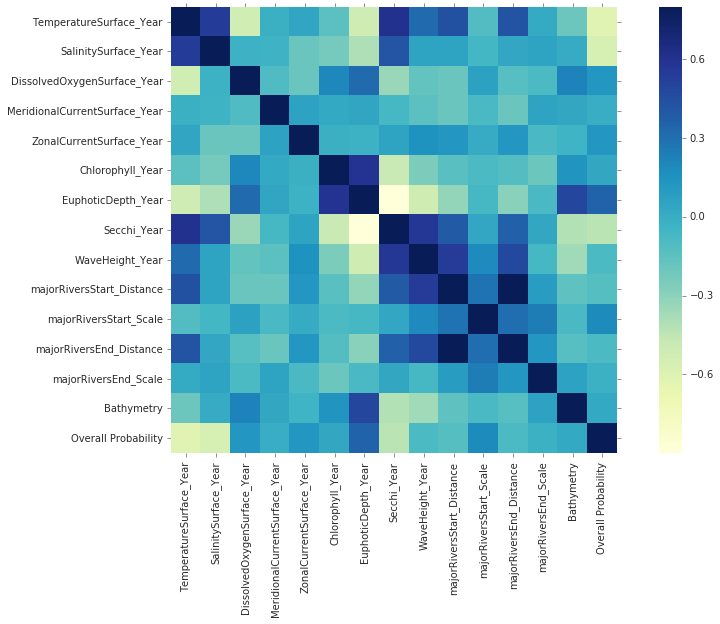

In [92]:
colsForCorr = columns
corrmat = engraulis_encrasicolus[colsForCorr].corr()
fig, ax = plt.subplots(figsize=(15,8))
sns.heatmap(corrmat, vmax=.8, square=True, cmap="YlGnBu");

Correlated variables are temperature, salinity and euphotic depth.

## Analysis between species

In [65]:
species = ['Engraulis encrasicolus','Sardina pilchardus','Sardinella aurita','Scomber scombrus','Scomber colias','Boops boops',
          'Spicara smaris','Mullus barbatus barbatus','Mullus surmuletus','Merluccius merluccius','Micromesistius poutassou',
           'Thunnus thynnus','Xiphias gladius','Pagellus erythrinus','Solea solea','Lophius budegassa']
speciesList = [engraulis_encrasicolus,sardina_pilchardus,sardinella_aurita,scomber_scombrus,scomber_colias,boops_boops,
              spicara_smaris,mullus_barbatus,mullus_surmuletus,merluccius_merluccius,micromesistius_poutassou,
              thunnus_thynnus,xiphias_gladius,pagellus_erythrinus,solea_solea,lophius_budegassa]
colors = ['#800000', '#9A6324' , '#808000', '#469990', '#000075', '#000000', '#f58231', '#bfef45', 
          '#3cb44b', '#42d4f4', '#911eb4', '#4363d8', '#ffe119', '#aaffc3', '#fabebe', '#FF0000']

### Temperature

In [66]:
hist_data = [df['TemperatureSurface_Year'] for df in speciesList]
group_labels = [c for c in species]
fig = ff.create_distplot(hist_data, group_labels, show_hist=False, colors=colors)
distplot1=fig['data']

my_fig = tls.make_subplots(rows=1)
my_fig.layout.update(title='Temperature Distribution' ,barmode = 'overlay', bargap=0.05, height=650, width=960)

for i in range(len(species)*2):
    my_fig.append_trace(distplot1[i], 1, 1)
#for i in range(len(species)*2):
#    my_fig.append_trace(distplot1[i], 1, 2)
iplot(my_fig)

This is the format of your plot grid:
[ (1,1) x1,y1 ]



### Temperature for all depth ranges

In [3]:
hist_data = [engraulis_encrasicolus['TemperatureSurface_Year'],engraulis_encrasicolus['Temperature100_300_Year']
            ,engraulis_encrasicolus['Temperature100_500_Year'],engraulis_encrasicolus['Temperature300_400_Year']
            ,engraulis_encrasicolus['TemperatureMaxDepth_Year']]
group_labels = ['Surface','100-300m mean','100-500m mean','300-400m mean','Max Depth']

fig = ff.create_distplot(hist_data, group_labels)
distplot1=fig['data']
###
hist_data = [sardina_pilchardus['TemperatureSurface_Year'],sardina_pilchardus['Temperature100_300_Year']
            ,sardina_pilchardus['Temperature100_500_Year'],sardina_pilchardus['Temperature300_400_Year']
            ,sardina_pilchardus['TemperatureMaxDepth_Year']]
group_labels = ['Surface2','100-300m mean2','100-500m mean2','300-400m mean2','Max Depth2']

fig = ff.create_distplot(hist_data, group_labels)
distplot2=fig['data']
###
hist_data = [sardinella_aurita['TemperatureSurface_Year'],sardinella_aurita['Temperature100_300_Year']
            ,sardinella_aurita['Temperature100_500_Year'],sardinella_aurita['Temperature300_400_Year']
            ,sardinella_aurita['TemperatureMaxDepth_Year']]
group_labels = ['Surface2','100-300m mean2','100-500m mean2','300-400m mean2','Max Depth2']

fig = ff.create_distplot(hist_data, group_labels)
distplot3=fig['data']
###
hist_data = [scomber_scombrus['TemperatureSurface_Year'],scomber_scombrus['Temperature100_300_Year']
            ,scomber_scombrus['Temperature100_500_Year'],scomber_scombrus['Temperature300_400_Year']
            ,scomber_scombrus['TemperatureMaxDepth_Year']]
group_labels = ['Surface2','100-300m mean2','100-500m mean2','300-400m mean2','Max Depth2']

fig = ff.create_distplot(hist_data, group_labels)
distplot4=fig['data']
###
hist_data = [scomber_colias['TemperatureSurface_Year'],scomber_colias['Temperature100_300_Year']
            ,scomber_colias['Temperature100_500_Year'],scomber_colias['Temperature300_400_Year']
            ,scomber_colias['TemperatureMaxDepth_Year']]
group_labels = ['Surface2','100-300m mean2','100-500m mean2','300-400m mean2','Max Depth2']

fig = ff.create_distplot(hist_data, group_labels)
distplot5=fig['data']
###
hist_data = [boops_boops['TemperatureSurface_Year'],boops_boops['Temperature100_300_Year']
            ,boops_boops['Temperature100_500_Year'],boops_boops['Temperature300_400_Year']
            ,boops_boops['TemperatureMaxDepth_Year']]
group_labels = ['Surface2','100-300m mean2','100-500m mean2','300-400m mean2','Max Depth2']

fig = ff.create_distplot(hist_data, group_labels)
distplot6=fig['data']
###
hist_data = [spicara_smaris['TemperatureSurface_Year'],spicara_smaris['Temperature100_300_Year']
            ,spicara_smaris['Temperature100_500_Year'],spicara_smaris['Temperature300_400_Year']
            ,spicara_smaris['TemperatureMaxDepth_Year']]
group_labels = ['Surface2','100-300m mean2','100-500m mean2','300-400m mean2','Max Depth2']

fig = ff.create_distplot(hist_data, group_labels)
distplot7=fig['data']
###
hist_data = [mullus_barbatus['TemperatureSurface_Year'],mullus_barbatus['Temperature100_300_Year']
            ,mullus_barbatus['Temperature100_500_Year'],mullus_barbatus['Temperature300_400_Year']
            ,mullus_barbatus['TemperatureMaxDepth_Year']]
group_labels = ['Surface2','100-300m mean2','100-500m mean2','300-400m mean2','Max Depth2']

fig = ff.create_distplot(hist_data, group_labels)
distplot8=fig['data']
###
hist_data = [mullus_surmuletus['TemperatureSurface_Year'],mullus_surmuletus['Temperature100_300_Year']
            ,mullus_surmuletus['Temperature100_500_Year'],mullus_surmuletus['Temperature300_400_Year']
            ,mullus_surmuletus['TemperatureMaxDepth_Year']]
group_labels = ['Surface2','100-300m mean2','100-500m mean2','300-400m mean2','Max Depth2']

fig = ff.create_distplot(hist_data, group_labels)
distplot9=fig['data']
###
hist_data = [merluccius_merluccius['TemperatureSurface_Year'],merluccius_merluccius['Temperature100_300_Year']
            ,merluccius_merluccius['Temperature100_500_Year'],merluccius_merluccius['Temperature300_400_Year']
            ,merluccius_merluccius['TemperatureMaxDepth_Year']]
group_labels = ['Surface2','100-300m mean2','100-500m mean2','300-400m mean2','Max Depth2']

fig = ff.create_distplot(hist_data, group_labels)
distplot10=fig['data']
###
hist_data = [micromesistius_poutassou['TemperatureSurface_Year'],micromesistius_poutassou['Temperature100_300_Year']
            ,micromesistius_poutassou['Temperature100_500_Year'],micromesistius_poutassou['Temperature300_400_Year']
            ,micromesistius_poutassou['TemperatureMaxDepth_Year']]
group_labels = ['Surface2','100-300m mean2','100-500m mean2','300-400m mean2','Max Depth2']

fig = ff.create_distplot(hist_data, group_labels)
distplot11=fig['data']
###
hist_data = [thunnus_thynnus['TemperatureSurface_Year'],thunnus_thynnus['Temperature100_300_Year']
            ,thunnus_thynnus['Temperature100_500_Year'],thunnus_thynnus['Temperature300_400_Year']
            ,thunnus_thynnus['TemperatureMaxDepth_Year']]
group_labels = ['Surface2','100-300m mean2','100-500m mean2','300-400m mean2','Max Depth2']

fig = ff.create_distplot(hist_data, group_labels)
distplot12=fig['data']
###
hist_data = [xiphias_gladius['TemperatureSurface_Year'],xiphias_gladius['Temperature100_300_Year']
            ,xiphias_gladius['Temperature100_500_Year'],xiphias_gladius['Temperature300_400_Year']
            ,xiphias_gladius['TemperatureMaxDepth_Year']]
group_labels = ['Surface2','100-300m mean2','100-500m mean2','300-400m mean2','Max Depth2']

fig = ff.create_distplot(hist_data, group_labels)
distplot13=fig['data']
###
hist_data = [pagellus_erythrinus['TemperatureSurface_Year'],pagellus_erythrinus['Temperature100_300_Year']
            ,pagellus_erythrinus['Temperature100_500_Year'],pagellus_erythrinus['Temperature300_400_Year']
            ,pagellus_erythrinus['TemperatureMaxDepth_Year']]
group_labels = ['Surface2','100-300m mean2','100-500m mean2','300-400m mean2','Max Depth2']

fig = ff.create_distplot(hist_data, group_labels)
distplot14=fig['data']
###
hist_data = [solea_solea['TemperatureSurface_Year'],solea_solea['Temperature100_300_Year']
            ,solea_solea['Temperature100_500_Year'],solea_solea['Temperature300_400_Year']
            ,solea_solea['TemperatureMaxDepth_Year']]
group_labels = ['Surface2','100-300m mean2','100-500m mean2','300-400m mean2','Max Depth2']

fig = ff.create_distplot(hist_data, group_labels)
distplot15=fig['data']
###
hist_data = [lophius_budegassa['TemperatureSurface_Year'],lophius_budegassa['Temperature100_300_Year']
            ,lophius_budegassa['Temperature100_500_Year'],lophius_budegassa['Temperature300_400_Year']
            ,lophius_budegassa['TemperatureMaxDepth_Year']]
group_labels = ['Surface2','100-300m mean2','100-500m mean2','300-400m mean2','Max Depth2']

fig = ff.create_distplot(hist_data, group_labels)
distplot16=fig['data']


my_fig = tls.make_subplots(rows=6, cols=3, subplot_titles=('Engraulis encrasicolus', 'Sardina pilchardus', 'Sardinella aurita',
                                                          'Scomber scombrus', 'Scomber colias', 'Boops boops', 'Spicara smaris',
                                                           'Mullus barbatus', 'Mullus surmuletus', 'Merluccius merluccius', 'Micromesistius poutassou',
                                                           'Thunnus thynnus', 'Xiphias gladius', 'Pagellus erythrinus', 'Solea solea', 'Lophius budegassa'))
my_fig.layout.update(title='Temperature Distribution' ,barmode = 'overlay', bargap=0.05, height=880, width=960)

for i in range(11):
    my_fig.append_trace(distplot1[i], 1, 1)
for i in range(11):
    my_fig.append_trace(distplot2[i], 1, 2)
for i in range(11):
    my_fig.append_trace(distplot3[i], 1, 3)
for i in range(11):
    my_fig.append_trace(distplot4[i], 2, 1)
for i in range(11):
    my_fig.append_trace(distplot5[i], 2, 2)
for i in range(11):
    my_fig.append_trace(distplot6[i], 2, 3)
for i in range(11):
    my_fig.append_trace(distplot7[i], 3, 1)
for i in range(11):
    my_fig.append_trace(distplot8[i], 3, 2)
for i in range(11):
    my_fig.append_trace(distplot9[i], 3, 3)
for i in range(11):
    my_fig.append_trace(distplot10[i], 4, 1)
for i in range(11):
    my_fig.append_trace(distplot11[i], 4, 2)
for i in range(11):
    my_fig.append_trace(distplot12[i], 4, 3)
for i in range(11):
    my_fig.append_trace(distplot13[i], 5, 1)
for i in range(11):
    my_fig.append_trace(distplot14[i], 5, 2)
for i in range(11):
    my_fig.append_trace(distplot15[i], 5, 3)
for i in range(11):
    my_fig.append_trace(distplot16[i], 6, 1)

for trace in my_fig['data']: 
    if('2' in trace['name']): trace['showlegend'] = False
iplot(my_fig)

This is the format of your plot grid:
[ (1,1) x1,y1 ]    [ (1,2) x2,y2 ]    [ (1,3) x3,y3 ]  
[ (2,1) x4,y4 ]    [ (2,2) x5,y5 ]    [ (2,3) x6,y6 ]  
[ (3,1) x7,y7 ]    [ (3,2) x8,y8 ]    [ (3,3) x9,y9 ]  
[ (4,1) x10,y10 ]  [ (4,2) x11,y11 ]  [ (4,3) x12,y12 ]
[ (5,1) x13,y13 ]  [ (5,2) x14,y14 ]  [ (5,3) x15,y15 ]
[ (6,1) x16,y16 ]  [ (6,2) x17,y17 ]  [ (6,3) x18,y18 ]



In [4]:
columns = [c for c in engraulis_encrasicolus.columns.values if c.startswith('Temperature') and c.endswith('Year')]
stats = pd.DataFrame(columns=['Skewness','Kurtosis','Mean','Min','25% quantile','Median','75% quantile','Max'])
df = engraulis_encrasicolus.copy()
for c in columns:
    stats = stats.append({
        'Name' : c,
        'Skewness' : df[c].skew(),
        'Kurtosis' : df[c].kurt(),
        'Mean' : df[c].mean(),
        'Min' : df[c].min(),
        '25% quantile' : df[c].quantile(0.25),
        'Median' : df[c].median(),
        '75% quantile' : df[c].quantile(0.75),
        'Max' : df[c].max(),
                                    }, ignore_index=True)
stats = stats.set_index('Name')
stats

,Skewness,Kurtosis,Mean,Min,25% quantile,Median,75% quantile,Max
Name,,,,,,,,
TemperatureSurface_Year,0.054854,-0.312995,17.873020,12.907340,16.731750,17.648125,19.023483,21.603925
Temperature100_300_Year,0.312148,-0.595138,16.801424,12.132779,15.281986,16.673600,18.135886,21.621100
Temperature300_400_Year,0.428290,-0.598351,16.568627,12.132779,14.883879,16.262326,17.887100,21.621100
Temperature100_500_Year,0.489783,-0.564042,16.431713,12.132779,14.595674,16.118244,17.814761,21.621100
TemperatureMaxDepth_Year,0.803736,0.921365,14.539903,9.359810,13.428100,14.170000,15.344600,19.846800


We can see that as the depth increases, skewness increases, which means that temperatures are moving to lower values. This can be visually seen in the previous figures.

Also, min and max for (100-300m, 300-400m, 100-500m) are the same and this is an outcome of how the dataset was created. For example, when creating the 100-300 column, if the depth was shallower than 100m, then the depth closer to 100m would be extracted from the external datasets.

Median is close to mean, meaning that distributions are close to the normal distribution.

Having kurtosis less than 3 means that the data are light-taled and lack outliers.

In [5]:
trace1 = go.Box(
    y=engraulis_encrasicolus['TemperatureSurface_Year'],
    name = 'Engraulis encrasicolus',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    )))        
trace2 = go.Box(
    y=sardina_pilchardus['TemperatureSurface_Year'],
    name = 'Sardina pilchardus',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    )))        
trace3 = go.Box(
    y=sardinella_aurita['TemperatureSurface_Year'],
    name = 'Sardinella aurita',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    ))) 
trace4 = go.Box(
    y=scomber_scombrus['TemperatureSurface_Year'],
    name = 'Scomber scombrus',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    ))) 
trace5 = go.Box(
    y=scomber_colias['TemperatureSurface_Year'],
    name = 'Scomber colias',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    ))) 
trace6 = go.Box(
    y=boops_boops['TemperatureSurface_Year'],
    name = 'Boops boops',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    ))) 
trace7 = go.Box(
    y=spicara_smaris['TemperatureSurface_Year'],
    name = 'Spicara smaris',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    ))) 
trace8 = go.Box(
    y=mullus_barbatus['TemperatureSurface_Year'],
    name = 'Mullus barbatus',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    ))) 
trace9 = go.Box(
    y=mullus_surmuletus['TemperatureSurface_Year'],
    name = 'Mullus surmuletus',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    ))) 
trace10 = go.Box(
    y=merluccius_merluccius['TemperatureSurface_Year'],
    name = 'Merluccius merluccius',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    ))) 
trace11 = go.Box(
    y=micromesistius_poutassou['TemperatureSurface_Year'],
    name = 'Micromesistius poutassou',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    ))) 
trace12 = go.Box(
    y=thunnus_thynnus['TemperatureSurface_Year'],
    name = 'Thunnus thynnus',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    ))) 
trace13 = go.Box(
    y=xiphias_gladius['TemperatureSurface_Year'],
    name = 'Xiphias gladius',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    )))
trace14 = go.Box(
    y=pagellus_erythrinus['TemperatureSurface_Year'],
    name = 'Pagellus erythrinus',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    )))
trace15 = go.Box(
    y=solea_solea['TemperatureSurface_Year'],
    name = 'Solea solea',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    )))
trace16 = go.Box(
    y=lophius_budegassa['TemperatureSurface_Year'],
    name = 'Lophius budegassa',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    )))

layout= go.Layout(
    title= 'Surface Temperature',
    xaxis=dict(
       tickangle=90
    )
)

dat = [trace1,trace2,trace3,trace4,trace5,trace6,trace7,trace8,trace9,trace10,trace11,trace12,trace13,trace14,trace15,trace16]
fig = dict(data=dat, layout=layout)
iplot(fig)

Generally, the species live in the same temperature conditions.

Spicara smaris, Thunnus thynnus and Xiphias gladius preffer warmer temperatures.

### Chlorophyll

In [6]:
hist_data = [engraulis_encrasicolus['Chlorophyll_Year']]
group_labels = ['Surface']

fig = ff.create_distplot(hist_data, group_labels)
distplot1=fig['data']
###
hist_data = [sardina_pilchardus['Chlorophyll_Year']]
group_labels = ['Surface2']

fig = ff.create_distplot(hist_data, group_labels)
distplot2=fig['data']
###
hist_data = [sardinella_aurita['Chlorophyll_Year']]
group_labels = ['Surface2']

fig = ff.create_distplot(hist_data, group_labels)
distplot3=fig['data']
###
hist_data = [scomber_scombrus['Chlorophyll_Year']]
group_labels = ['Surface2']

fig = ff.create_distplot(hist_data, group_labels)
distplot4=fig['data']
###
hist_data = [scomber_colias['Chlorophyll_Year']]
group_labels = ['Surface2']

fig = ff.create_distplot(hist_data, group_labels)
distplot5=fig['data']
###
hist_data = [boops_boops['Chlorophyll_Year']]
group_labels = ['Surface2']

fig = ff.create_distplot(hist_data, group_labels)
distplot6=fig['data']
###
hist_data = [spicara_smaris['Chlorophyll_Year']]
group_labels = ['Surface2']

fig = ff.create_distplot(hist_data, group_labels)
distplot7=fig['data']
###
hist_data = [mullus_barbatus['Chlorophyll_Year']]
group_labels = ['Surface2']

fig = ff.create_distplot(hist_data, group_labels)
distplot8=fig['data']
###
hist_data = [mullus_surmuletus['Chlorophyll_Year']]
group_labels = ['Surface2']

fig = ff.create_distplot(hist_data, group_labels)
distplot9=fig['data']
###
hist_data = [merluccius_merluccius['Chlorophyll_Year']]
group_labels = ['Surface2']

fig = ff.create_distplot(hist_data, group_labels)
distplot10=fig['data']
###
hist_data = [micromesistius_poutassou['Chlorophyll_Year']]
group_labels = ['Surface2']

fig = ff.create_distplot(hist_data, group_labels)
distplot11=fig['data']
###
hist_data = [thunnus_thynnus['Chlorophyll_Year']]
group_labels = ['Surface2']

fig = ff.create_distplot(hist_data, group_labels)
distplot12=fig['data']
###
hist_data = [xiphias_gladius['Chlorophyll_Year']]
group_labels = ['Surface2']

fig = ff.create_distplot(hist_data, group_labels)
distplot13=fig['data']
###
hist_data = [pagellus_erythrinus['Chlorophyll_Year']]
group_labels = ['Surface2']

fig = ff.create_distplot(hist_data, group_labels)
distplot14=fig['data']
###
hist_data = [solea_solea['Chlorophyll_Year']]
group_labels = ['Surface2']

fig = ff.create_distplot(hist_data, group_labels)
distplot15=fig['data']
###
hist_data = [lophius_budegassa['Chlorophyll_Year']]
group_labels = ['Surface2']

fig = ff.create_distplot(hist_data, group_labels)
distplot16=fig['data']


my_fig = tls.make_subplots(rows=6, cols=3, subplot_titles=('Engraulis encrasicolus', 'Sardina pilchardus', 'Sardinella aurita',
                                                          'Scomber scombrus', 'Scomber colias', 'Boops boops', 'Spicara smaris',
                                                           'Mullus barbatus', 'Mullus surmuletus', 'Merluccius merluccius', 'Micromesistius poutassou',
                                                           'Thunnus thynnus', 'Xiphias gladius', 'Pagellus erythrinus', 'Solea solea', 'Lophius budegassa'))
my_fig.layout.update(title='Chlorophyll Distribution' ,barmode = 'overlay', bargap=0.05, height=880, width=960)

for i in range(3):
    my_fig.append_trace(distplot1[i], 1, 1)
for i in range(3):
    my_fig.append_trace(distplot2[i], 1, 2)
for i in range(3):
    my_fig.append_trace(distplot3[i], 1, 3)
for i in range(3):
    my_fig.append_trace(distplot4[i], 2, 1)
for i in range(3):
    my_fig.append_trace(distplot5[i], 2, 2)
for i in range(3):
    my_fig.append_trace(distplot6[i], 2, 3)
for i in range(3):
    my_fig.append_trace(distplot7[i], 3, 1)
for i in range(3):
    my_fig.append_trace(distplot8[i], 3, 2)
for i in range(3):
    my_fig.append_trace(distplot9[i], 3, 3)
for i in range(3):
    my_fig.append_trace(distplot10[i], 4, 1)
for i in range(3):
    my_fig.append_trace(distplot11[i], 4, 2)
for i in range(3):
    my_fig.append_trace(distplot12[i], 4, 3)
for i in range(3):
    my_fig.append_trace(distplot13[i], 5, 1)
for i in range(3):
    my_fig.append_trace(distplot14[i], 5, 2)
for i in range(3):
    my_fig.append_trace(distplot15[i], 5, 3)
for i in range(3):
    my_fig.append_trace(distplot16[i], 6, 1)

for trace in my_fig['data']: 
    if('2' in trace['name']): trace['showlegend'] = False
iplot(my_fig)

This is the format of your plot grid:
[ (1,1) x1,y1 ]    [ (1,2) x2,y2 ]    [ (1,3) x3,y3 ]  
[ (2,1) x4,y4 ]    [ (2,2) x5,y5 ]    [ (2,3) x6,y6 ]  
[ (3,1) x7,y7 ]    [ (3,2) x8,y8 ]    [ (3,3) x9,y9 ]  
[ (4,1) x10,y10 ]  [ (4,2) x11,y11 ]  [ (4,3) x12,y12 ]
[ (5,1) x13,y13 ]  [ (5,2) x14,y14 ]  [ (5,3) x15,y15 ]
[ (6,1) x16,y16 ]  [ (6,2) x17,y17 ]  [ (6,3) x18,y18 ]



In [7]:
columns = [c for c in engraulis_encrasicolus.columns.values if c.startswith('Chlorophyll') and c.endswith('Year')]
stats = pd.DataFrame(columns=['Skewness','Kurtosis','Mean','Min','25% quantile','Median','75% quantile','Max'])
df = engraulis_encrasicolus.copy()
for c in columns:
    stats = stats.append({
        'Name' : c,
        'Skewness' : df[c].skew(),
        'Kurtosis' : df[c].kurt(),
        'Mean' : df[c].mean(),
        'Min' : df[c].min(),
        '25% quantile' : df[c].quantile(0.25),
        'Median' : df[c].median(),
        '75% quantile' : df[c].quantile(0.75),
        'Max' : df[c].max(),
                                    }, ignore_index=True)
stats = stats.set_index('Name')
stats

,Skewness,Kurtosis,Mean,Min,25% quantile,Median,75% quantile,Max
Name,,,,,,,,
Chlorophyll_Year,8.379535,99.569156,0.421059,0.025583,0.096784,0.141391,0.268748,17.553393


Very high skeness and extreme kurtosis mean some serious outliers.

We need to further analyze the data.

In [8]:
trace1 = go.Box(
    y=engraulis_encrasicolus['Chlorophyll_Year'],
    name = 'Engraulis encrasicolus',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    )))        
trace2 = go.Box(
    y=sardina_pilchardus['Chlorophyll_Year'],
    name = 'Sardina pilchardus',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    )))        
trace3 = go.Box(
    y=sardinella_aurita['Chlorophyll_Year'],
    name = 'Sardinella aurita',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    ))) 
trace4 = go.Box(
    y=scomber_scombrus['Chlorophyll_Year'],
    name = 'Scomber scombrus',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    ))) 
trace5 = go.Box(
    y=scomber_colias['Chlorophyll_Year'],
    name = 'Scomber colias',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    ))) 
trace6 = go.Box(
    y=boops_boops['Chlorophyll_Year'],
    name = 'Boops boops',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    ))) 
trace7 = go.Box(
    y=spicara_smaris['Chlorophyll_Year'],
    name = 'Spicara smaris',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    ))) 
trace8 = go.Box(
    y=mullus_barbatus['Chlorophyll_Year'],
    name = 'Mullus barbatus',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    ))) 
trace9 = go.Box(
    y=mullus_surmuletus['Chlorophyll_Year'],
    name = 'Mullus surmuletus',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    ))) 
trace10 = go.Box(
    y=merluccius_merluccius['Chlorophyll_Year'],
    name = 'Merluccius merluccius',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    ))) 
trace11 = go.Box(
    y=micromesistius_poutassou['Chlorophyll_Year'],
    name = 'Micromesistius poutassou',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    ))) 
trace12 = go.Box(
    y=thunnus_thynnus['Chlorophyll_Year'],
    name = 'Thunnus thynnus',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    ))) 
trace13 = go.Box(
    y=xiphias_gladius['Chlorophyll_Year'],
    name = 'Xiphias gladius',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    )))
trace14 = go.Box(
    y=pagellus_erythrinus['Chlorophyll_Year'],
    name = 'Pagellus erythrinus',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    )))
trace15 = go.Box(
    y=solea_solea['Chlorophyll_Year'],
    name = 'Solea solea',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    )))
trace16 = go.Box(
    y=lophius_budegassa['Chlorophyll_Year'],
    name = 'Lophius budegassa',
    pointpos = -1.8,
    jitter = 0.3,
    boxpoints = 'all',    
    marker = dict(
        line = dict(
          color = 'rgb(0, 0, 0)',
          width = 0.2
    )))

layout= go.Layout(
    title= 'Chlorophyll',
    xaxis=dict(
       tickangle=90
    )
)

dat = [trace1,trace2,trace3,trace4,trace5,trace6,trace7,trace8,trace9,trace10,trace11,trace12,trace13,trace14,trace15,trace16]
fig = dict(data=dat, layout=layout)
iplot(fig)

#### Let's see where on map high values of Chlorophyll are

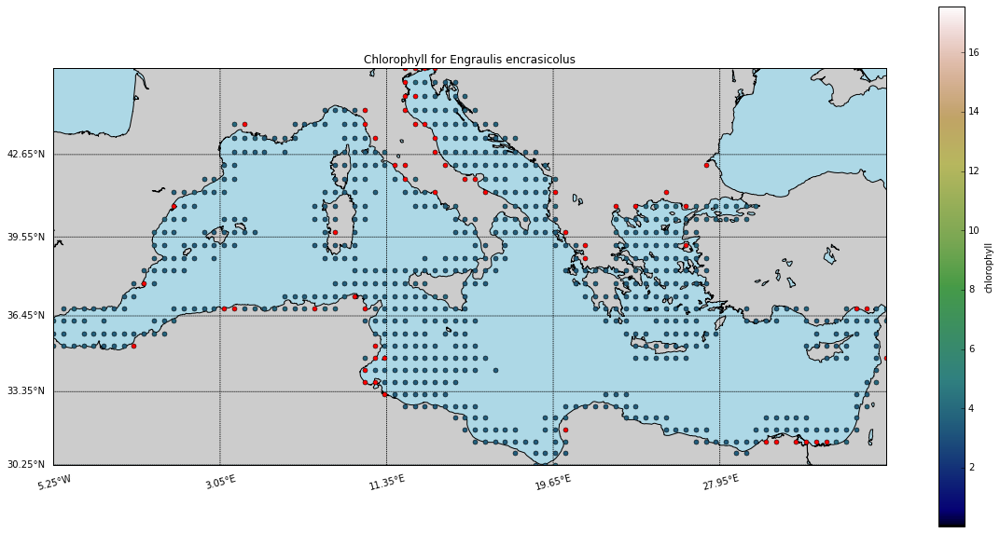

In [9]:
# How much to zoom from coordinates (in degrees)
zoom_scale = 0
lats = engraulis_encrasicolus['Center Lat'].tolist()
lons = engraulis_encrasicolus['Center Long'].tolist()
prob = engraulis_encrasicolus['Chlorophyll_Year'].tolist()

# Setup the bounding box for the zoom and bounds of the map
bbox = [np.min(lats)-zoom_scale,np.max(lats)+zoom_scale,\
        np.min(lons)-zoom_scale,np.max(lons)+zoom_scale]

fig, ax = plt.subplots(figsize=(20,10))
plt.title("Chlorophyll for Engraulis encrasicolus")
# Define the projection, scale, the corners of the map, and the resolution.
m = Basemap(projection='merc',llcrnrlat=bbox[0],urcrnrlat=bbox[1],\
            llcrnrlon=bbox[2],urcrnrlon=bbox[3],lat_ts=10,resolution='i')

# Draw coastlines and fill continents and water with color
m.drawcoastlines()
m.fillcontinents(color='#CCCCCC',lake_color='lightblue')

# draw parallels, meridians, and color boundaries
m.drawparallels(np.arange(bbox[0],bbox[1],(bbox[1]-bbox[0])/5),labels=[1,0,0,0])
m.drawmeridians(np.arange(bbox[2],bbox[3],(bbox[3]-bbox[2])/5),labels=[0,0,0,1],rotation=15)
m.drawmapboundary(fill_color='lightblue')

# format colors for elevation range
alt_min = np.min(prob)
alt_max = np.max(prob)
cmap = plt.get_cmap('gist_earth')
normalize = matplotlib.colors.Normalize(vmin=alt_min, vmax=alt_max)

# plot elevations with different colors using the numpy interpolation mapping tool
# the range [50,200] can be changed to create different colors and ranges
for ii in range(0,len(prob)):
    x,y = m(lons[ii],lats[ii])
    color_interp = np.interp(prob[ii],[alt_min,alt_max],[50,200])
    if(prob[ii]<1):       
        plt.plot(x,y,markersize=5.0,marker='o',color=cmap(int(color_interp)))
    else:
        plt.plot(x,y,markersize=5.0,marker='o',color='red')

# format the colorbar 
cax, _ = matplotlib.colorbar.make_axes(ax)
cbar = matplotlib.colorbar.ColorbarBase(cax, cmap=cmap,norm=normalize,label='chlorophyll')

# save the figure and show it
#plt.savefig('engraulis_chlorophyll.png', format='png', dpi=500,transparent=True)
plt.show()

The common of these points is that they are on land. Maybe there is human activity in those places like ports, or there are rivers.

Correlation of Chlorophyll_Year and Overall Probability

In [10]:
engraulis_encrasicolus[['Chlorophyll_Year','Overall Probability']].corr()

,Chlorophyll_Year,Overall Probability
Chlorophyll_Year,1.000000,0.031159
Overall Probability,0.031159,1.000000


Correlation of Chlorophyll_Year and Overall Probability when Chlorophyll_Year>1

In [11]:
engraulis_encrasicolus[['Chlorophyll_Year','Overall Probability']][engraulis_encrasicolus['Chlorophyll_Year']>1].corr()

,Chlorophyll_Year,Overall Probability
Chlorophyll_Year,1.000000,-0.169324
Overall Probability,-0.169324,1.000000


5 times more correlated with overall probability when Chlorophyll_Year>1. Chlorophyll seems like a strong feature for machine learning